In [1]:
%matplotlib inline
import ipfix, qof, imp
import template, graph
from misc import stop
from loader import load_df
import pandas as pd

# init IE specs
ipfix.ie.use_iana_default()
ipfix.ie.use_5103_default()
ipfix.ie.use_specfile("qof.iespec")
ipfix.ie.use_specfile("copycat.iespec")
ipfix.types.use_integer_ipv4()

# init campaign variables
output_dir  = "plots/"
all_cids1 = ["sch1-0002-t3-f1-1", "sch1-0002-t3-f1-2", "sch1-0002-t3-f1-3"]#, "sch1-0002-t3-f1-4"]
all_cids2 = ["sch1-0002-t3-f2-1", "sch1-0002-t3-f2-2", "sch1-0002-t3-f2-3"]#,"sch1-0002-t3-f2-4"]
all_cids3 = ["sch1-0003-t3-f1-4", "sch1-0003-t3-f2-4"]
all_cids=all_cids1+all_cids2+all_cids3 

In [3]:
tcp, udpc, udps = load_df(all_cids,
                         template.bandwidth_udp,
                         template.bandwidth_tcp,
                         template.index_total,
                         load_udps=True,
                         offset=3)

Loading tcp flows sch1-0002-t3-f1-1 ...
Loading udp client flows sch1-0002-t3-f1-1 ...
Loading udp server flows sch1-0002-t3-f1-1 ...
sch1-0002-t3-f1-1.copycatRunId += 0
Loading tcp flows sch1-0002-t3-f1-2 ...
Loading udp client flows sch1-0002-t3-f1-2 ...
Loading udp server flows sch1-0002-t3-f1-2 ...
sch1-0002-t3-f1-2.copycatRunId += 3
Loading tcp flows sch1-0002-t3-f1-3 ...
Loading udp client flows sch1-0002-t3-f1-3 ...
Loading udp server flows sch1-0002-t3-f1-3 ...
sch1-0002-t3-f1-3.copycatRunId += 6
Loading tcp flows sch1-0002-t3-f2-1 ...
Loading udp client flows sch1-0002-t3-f2-1 ...
Loading udp server flows sch1-0002-t3-f2-1 ...
sch1-0002-t3-f2-1.copycatRunId += 9
Loading tcp flows sch1-0002-t3-f2-2 ...
Loading udp client flows sch1-0002-t3-f2-2 ...
Loading udp server flows sch1-0002-t3-f2-2 ...
sch1-0002-t3-f2-2.copycatRunId += 12
Loading tcp flows sch1-0002-t3-f2-3 ...
Loading udp client flows sch1-0002-t3-f2-3 ...
Loading udp server flows sch1-0002-t3-f2-3 ...
sch1-0002-t3-f2

In [4]:
tcp.reset_index().dtypes

sourceIPv4Address                          object
destinationIPv4Address                     object
destinationTransportPort                    int64
copycatRunId                                int64
copycatFileSize                             int64
copycatCampaignId                          object
reverseTransportOctetDeltaCount             int64
reverseOctetDeltaCount                      int64
flowEndMilliseconds                datetime64[ns]
flowStartMilliseconds              datetime64[ns]
dtype: object

In [5]:
# clean df
udpc = udpc[udpc.copycatBandwidth != 100].reset_index()
udpc = udpc[(udpc.copycatRtt != 0) & (udpc.copycatRtt != 0.1) & (udpc.copycatRtt != 0.3) & (udpc.copycatBandwidth != 100000)]
tcp = tcp.reset_index()

ind = ("sourceIPv4Address","destinationIPv4Address",
        "destinationTransportPort", "copycatRunId",
        "copycatFileSize")
udpc = udpc[((udpc.copycatFileSize == 4088833) & 
           (((udpc.copycatCampaignId == "0003") & 
          ((udpc.destinationTransportPort == 12345) | (udpc.destinationTransportPort == 8008)))
           | (udpc.copycatCampaignId == "0002")) 
           | (udpc.copycatFileSize != 4088833))].drop_duplicates(ind).set_index(list(ind))

tcp = tcp[((tcp.copycatFileSize == 4088833) & 
           (((tcp.copycatCampaignId == "0003") & 
          ((tcp.destinationTransportPort == 12345) | (tcp.destinationTransportPort == 8008)))
           | (tcp.copycatCampaignId == "0002")) 
           | (tcp.copycatFileSize != 4088833))].drop_duplicates(ind).set_index(list(ind))

In [6]:
#reverseTransportOctetDeltaCount reverseOctetDeltaCount  durationSeconds
# compute duration if you forgot to extract it
data_cols = ["reverseTransportOctetDeltaCount", "reverseOctetDeltaCount",  "durationSeconds"]
tcp_df = qof.derive_duration(tcp)[data_cols]
udp_df = qof.derive_duration(udpc)[data_cols]
#udpc.protocolIdentifier.value_counts()
#tcp.protocolIdentifier.value_counts()
#tcp_df
ind = ["sourceIPv4Address","destinationIPv4Address",
       "destinationTransportPort", "copycatFileSize", "copycatRunId"]
tcp_df = tcp_df.reset_index().drop_duplicates(ind).set_index(ind)
udp_df = udp_df.reset_index().drop_duplicates(ind).set_index(ind)
udp_df

,,,,,reverseTransportOctetDeltaCount,reverseOctetDeltaCount,durationSeconds
sourceIPv4Address,destinationIPv4Address,destinationTransportPort,copycatFileSize,copycatRunId,,,
132.239.17.224,134.34.246.4,1228,13313,0,13313,14125,0.884001
211.68.70.40,134.34.246.4,1228,13313,0,3389,3613,0.662000
193.196.39.9,134.34.246.4,1228,13313,0,13313,14125,0.158000
128.232.103.201,134.34.246.4,1228,13313,0,13313,14125,0.218000
143.215.131.198,134.34.246.4,1228,13313,0,13313,14125,0.621000
222.197.180.139,134.34.246.4,1228,13313,0,13313,14125,1.829000
149.43.80.22,134.34.246.4,1228,13313,0,13313,14125,0.532001
204.85.191.11,134.34.246.4,1228,13313,0,13313,14125,0.599000
162.105.205.22,134.34.246.4,1228,13313,0,13313,14125,1.539000


In [7]:
ind = ["sourceIPv4Address", "destinationIPv4Address",
       "destinationTransportPort", "copycatFileSize" ,
       "copycatRunId"]
tcp_df = tcp_df.reset_index()
udp_df = udp_df.reset_index()

# drop flows that transfered less than half the file
tresh = .5
tcp_df = tcp_df[tcp_df.copycatFileSize*tresh <= tcp_df.reverseTransportOctetDeltaCount].set_index(ind)
udp_df = udp_df[udp_df.copycatFileSize*tresh <= udp_df.reverseTransportOctetDeltaCount].set_index(ind)

# compute bandwidth and throughput
udp_df["bandwidth"] = udp_df["reverseOctetDeltaCount"] / udp_df["durationSeconds"]
tcp_df["bandwidth"] = tcp_df["reverseOctetDeltaCount"] / tcp_df["durationSeconds"]
udp_df["throughput"] = udp_df["reverseTransportOctetDeltaCount"] / udp_df["durationSeconds"]
tcp_df["throughput"] = tcp_df["reverseTransportOctetDeltaCount"] / tcp_df["durationSeconds"]


In [8]:
udp_df

,,,,,reverseTransportOctetDeltaCount,reverseOctetDeltaCount,durationSeconds,bandwidth,throughput
sourceIPv4Address,destinationIPv4Address,destinationTransportPort,copycatFileSize,copycatRunId,,,,,
132.239.17.224,134.34.246.4,1228,13313,0,13313,14125,0.884001,15978.488712,15059.937715
193.196.39.9,134.34.246.4,1228,13313,0,13313,14125,0.158000,89398.734177,84259.493671
128.232.103.201,134.34.246.4,1228,13313,0,13313,14125,0.218000,64793.577982,61068.807339
143.215.131.198,134.34.246.4,1228,13313,0,13313,14125,0.621000,22745.571659,21438.003221
222.197.180.139,134.34.246.4,1228,13313,0,13313,14125,1.829000,7722.799344,7278.840897
149.43.80.22,134.34.246.4,1228,13313,0,13313,14125,0.532001,26550.701972,25024.389052
204.85.191.11,134.34.246.4,1228,13313,0,13313,14125,0.599000,23580.968280,22225.375626
162.105.205.22,134.34.246.4,1228,13313,0,13313,14125,1.539000,9178.037687,8650.422352
128.10.18.52,134.34.246.4,1228,13313,0,13313,14125,0.766000,18439.947781,17379.895561


In [9]:
# compute differences
diff_bw  = (udp_df["bandwidth"] - tcp_df["bandwidth"]).dropna()
diff_t   = (udp_df["throughput"] - tcp_df["throughput"]).dropna()
diff_dur = (udp_df["durationSeconds"] - tcp_df["durationSeconds"]).dropna()


In [10]:
diff_bw

sourceIPv4Address  destinationIPv4Address  destinationTransportPort  copycatFileSize  copycatRunId
62.108.171.76      80.65.237.10            1228                      13313            0                  1918.563779
                                                                                      2                 -7082.261530
                                                                                      9                -13262.836679
                                                                                      10                -9626.341214
                                                                                      11                -1906.264176
                                                                     39937            3                 57784.164793
                                                                                      4                 20098.192951
                                                                                  

In [16]:
# clip extremums
max_bw      = 10e5
min_bw      = 10e2
diff_max_bw = 5*10e4
max_dur     = 5
imp.reload(graph)
# plot"plots/t.pdf"
_=graph.cdf(diff_t.clip(-diff_max_bw,diff_max_bw), 
           "", "Rate (kB/sec)", 
           "CDF", "plots/t.pdf",  num=10000, scix=False, xlim=[-diff_max_bw,diff_max_bw],
           xticks = tuple(range(int(-5e5),int(5e5+1),int(1e5))), 
           xtickslabel = [str(e) if (e%200==0) else "" for e in range(int(-5e2),int(5e2+1),int(1e2))],
           legendloc=4, font_size=15, ann=[("Higher TCP\nthroughput",(-(diff_max_bw*0.85),.55)),
                                           ("Higher UDP\nthroughput",((diff_max_bw*0.15),.55))])

#_=graph.cdf(diff_dur.clip(-max_dur,max_dur), 
#          "UDP/TCP differential durations", "Flow duration in sec.", 
#          "CDF", None, num=10000, xlim=[-5,5],
#          legendloc=4, font_size=15)

In [15]:
# Extract each file/block size combination separately into tcp_dfs, udp_dfs
offset  = 3
to_plot = 8
soff    = 0
eoff    = soff + offset
#
ind = ["sourceIPv4Address", "destinationIPv4Address",
       "destinationTransportPort"]
ies = ["sourceIPv4Address", "destinationIPv4Address", 
       "destinationTransportPort", "copycatFileSize",
       "copycatRunId", "reverseTransportOctetDeltaCount",
       "reverseOctetDeltaCount" ,"durationSeconds",
       "bandwidth" ,"throughput"]
tcp_df = tcp_df.reset_index()[ies]
udp_df = udp_df.reset_index()[ies]

tcp_dfs = []
udp_dfs = []
for i in range(to_plot):
    this_tcp_df = tcp_df[(tcp_df.copycatRunId >= soff) & (tcp_df.copycatRunId < eoff)].set_index(ind)
    this_udp_df = udp_df[(udp_df.copycatRunId >= soff) & (udp_df.copycatRunId < eoff)].set_index(ind)
    
    tcp_dfs.append(this_tcp_df)
    udp_dfs.append(this_udp_df)
    
    soff += 3 
    eoff += 3 

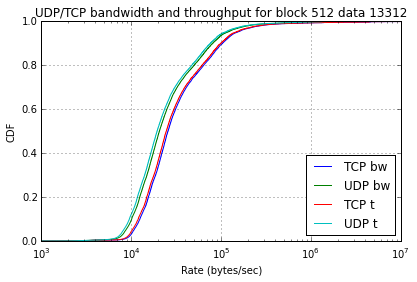

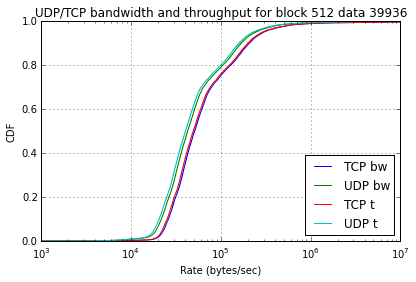

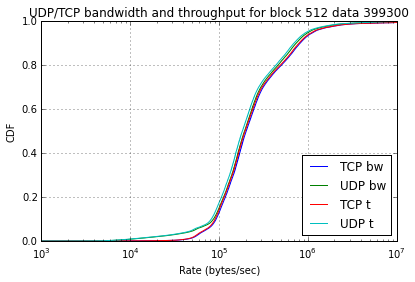

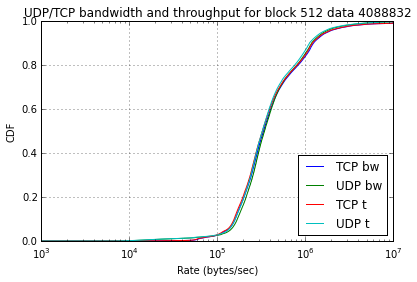

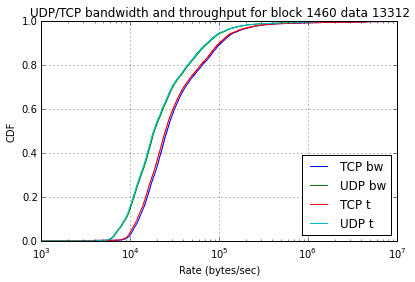

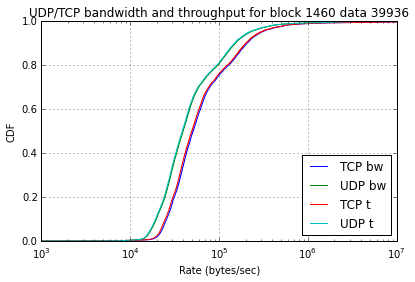

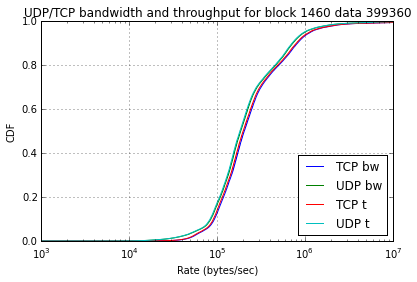

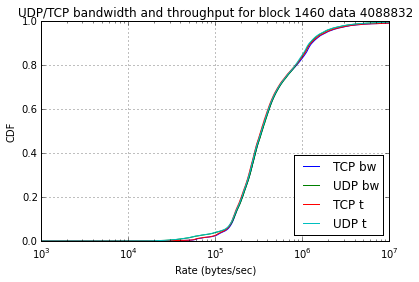

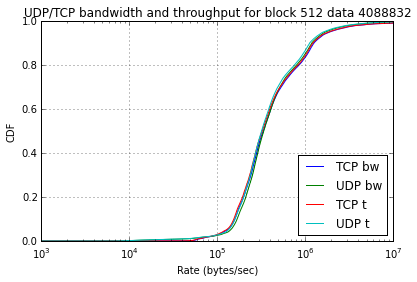

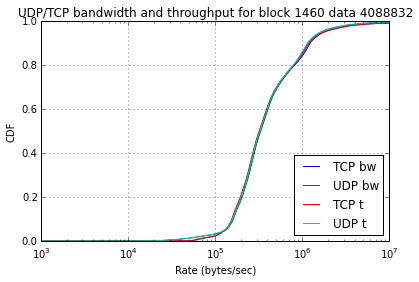

In [187]:
import numpy as np
imp.reload(graph)
# plot with no averaging
max_bw      = 10e6
min_bw      = 10e2
# !!! There's a matplotlib bug here that opens 250+ fds and let em open. Run this block at the end...
for this_tcp, this_udp in zip(tcp_dfs, udp_dfs):
    
    filesize  = this_tcp.copycatFileSize.value_counts().index[0] - 1
    # 512:  [3; 15[U[27; 30]
    # 1460: [15; 27[U[30; 33[
    cid       = this_tcp.copycatRunId.value_counts().index[0]   
    if cid < 12 or (cid >= 24 and cid < 27):
        blocksize = 512
    elif (cid >= 12 and cid < 24) or (cid >= 27 and cid < 30):
        blocksize = 1460 
    
    graph.cdf([this_tcp["bandwidth"].clip(min_bw,max_bw), this_udp["bandwidth"].clip(min_bw,max_bw), 
               this_tcp["throughput"].clip(min_bw,max_bw), this_udp["throughput"].clip(min_bw,max_bw)], 
               "UDP/TCP bandwidth and throughput for block "+str(blocksize)+" data "+str(filesize), "Rate (bytes/sec)", "CDF", 
               None, labels=["TCP bw","UDP bw", "TCP t","UDP t"], 
               legendloc=4, logx=True, log=True)#, font_size=14)

In [16]:
import pylab as p
    
def gridplot(a, label, cmap="RdBu", vrange=None, file=None, lim=None, title=None, ticks=None, font_size=None):
    if font_size:
        p.rcParams.update({'font.size'   : font_size})
    p.figure() # figsize=(7,2.5)
    if vrange is None:
        p.pcolor(a, cmap=cmap)
    else:
        p.pcolor(a, cmap=cmap, vmin=vrange[0], vmax=vrange[1])
    if lim:
        p.xlim(lim)
        p.ylim(lim)
    if ticks: 
        p.xticks(ticks,("NA", "EU", "AS", "O")) 
        p.yticks(ticks,("NA", "EU", "AS", "O")) 
    p.xlabel("probe (by continents and countries)")
    p.ylabel("anchor (by continents and countries)")
    p.colorbar(label=label)
    if title:
        p.title(title)
    p.tight_layout()
    if file:
        p.savefig(file)

def clean_df(df, data_col="mean", nb_nodes=220):
    """
    only keep nodes that have data for src and dst, and more than 50% flows
    sourceIPv4Address & destinationIPv4Address must be in nb_countries format (int)
    """    
    nodes=sorted(list(set(df.sourceIPv4Address.value_counts().index) 
                 & set(df.destinationIPv4Address.value_counts().index)))
    min_count = nb_nodes * .5
    
    clean_count=0
    for n in range(nb_nodes):
        if n in nodes:
            l1=len(df[df.destinationIPv4Address == n][data_col])
            l2=len(df[df.sourceIPv4Address == n][data_col])
            if l1 >= min_count and l2 >= min_count:
                clean_count += 1
                continue
                
        df = df[(df.destinationIPv4Address != n) & (df.sourceIPv4Address != n)]       
            
    return df, clean_count
    
def get_continent_index(df):
    """
    returns a continent index tuple    
    (0,95,158,191)
    """
    ind   = [0]
    i     = 1
    c     = 0
    nodes = sorted(list(df.sourceIPv4Address.value_counts().index))
    cont_index = sorted(list(locations.continent_nb.values()))
    
    for n in nodes:
        if i == 4:
            break
        elif n >= cont_index[i]:
            ind.append(c)
            i += 1
        c += 1
    return tuple(ind)

def get_blocksize(cid):
    if cid < 9 or (cid >= 18 and cid < 21):
        blocksize = 512
    elif (cid >= 9 and cid < 18) or (cid >= 21 and cid < 24):
        blocksize = 1460 
    return blocksize

port 1228 block 512 data 13312
tcp nodes: 203 udp nodes:198
tcp mean t: 72306.92 udp mean t: 39969.00

port 12345 block 512 data 13312
tcp nodes: 188 udp nodes:183
tcp mean t: 76270.44 udp mean t: 41632.00

port 8008 block 512 data 13312
tcp nodes: 201 udp nodes:198
tcp mean t: 74105.47 udp mean t: 40755.34

port 1228 block 512 data 39936
tcp nodes: 199 udp nodes:194
tcp mean t: 150964.60 udp mean t: 84262.91

port 12345 block 512 data 39936
tcp nodes: 187 udp nodes:181
tcp mean t: 154179.17 udp mean t: 85565.56

port 8008 block 512 data 39936
tcp nodes: 198 udp nodes:195
tcp mean t: 152755.34 udp mean t: 84680.94

port 1228 block 512 data 399300
tcp nodes: 196 udp nodes:191
tcp mean t: 507221.77 udp mean t: 337468.04

port 12345 block 512 data 399300
tcp nodes: 181 udp nodes:172
tcp mean t: 527315.92 udp mean t: 353412.22

port 8008 block 512 data 399300
tcp nodes: 190 udp nodes:187
tcp mean t: 521360.44 udp mean t: 347559.77

port 1228 block 1460 data 13312
tcp nodes: 202 udp nodes:1

/usr/local/lib/python3.4/dist-packages/matplotlib/pyplot.py:424: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


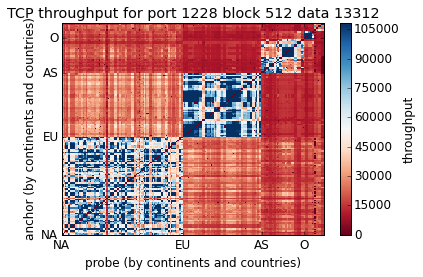

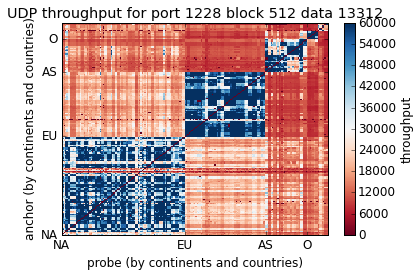

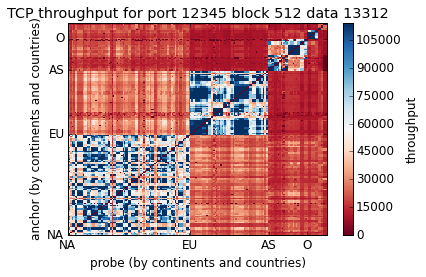

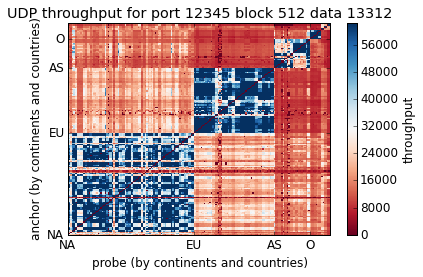

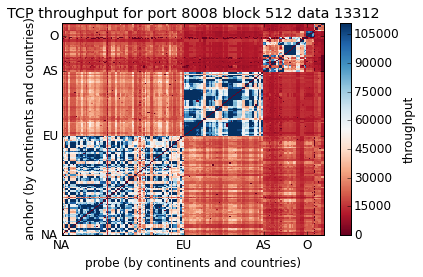

...

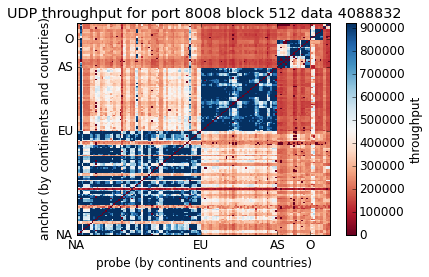

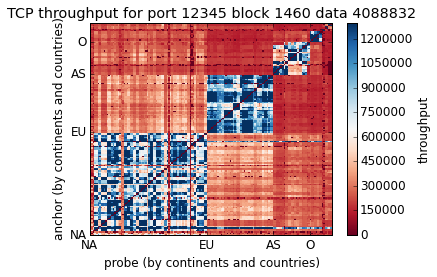

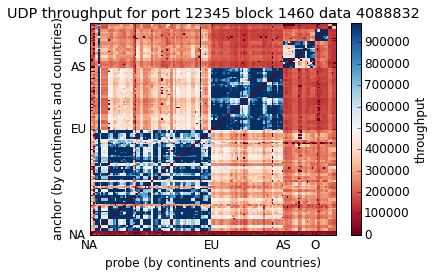

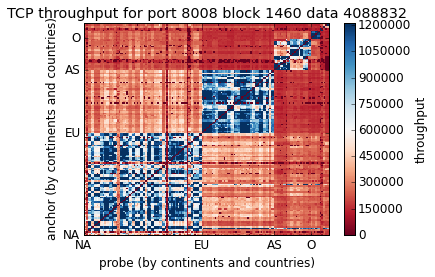

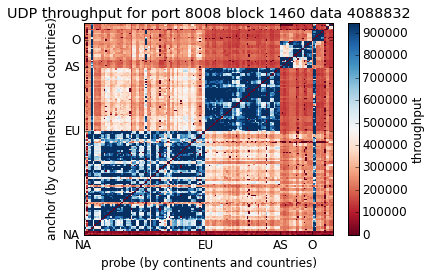

In [17]:
# thoughput per (filesize, blocksize, port, transport)-tuple heatmaps
import numpy as np
import config, locations
min_nodes = 100

for this_tcp, this_udp in zip(tcp_dfs, udp_dfs):

    this_tcp  = this_tcp.replace(float('inf'),0).reset_index()
    this_udp  = this_udp.replace(float('inf'),0).reset_index()
    
    # retreive filesize & blocksize
    filesize  = this_tcp.copycatFileSize.value_counts().index[0] - 1
    cid       = this_tcp.copycatRunId.value_counts().index[0] 
    blocksize = get_blocksize(cid)
    
    # Average RTTs
    grouped_tcp = this_tcp.groupby(["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort"])["throughput"]
    grouped_udp = this_udp.groupby(["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort"])["throughput"]

    this_tcp = grouped_tcp.agg([np.mean]).reset_index()
    this_udp = grouped_udp.agg([np.mean]).reset_index()

    for port in [1228, 12345, 8008]:
        # pick data for one port
        this_tcp_port = this_tcp[this_tcp.destinationTransportPort == port][["sourceIPv4Address","destinationIPv4Address", "mean"]]
        this_udp_port = this_udp[this_udp.destinationTransportPort == port][["sourceIPv4Address","destinationIPv4Address", "mean"]]

        # map node IPs to ordered ints
        this_tcp_port.sourceIPv4Address      = this_tcp_port.sourceIPv4Address.map(locations.countries_nb2)
        this_udp_port.sourceIPv4Address      = this_udp_port.sourceIPv4Address.map(locations.countries_nb2)    
        this_tcp_port.destinationIPv4Address = this_tcp_port.destinationIPv4Address.map(locations.countries_nb2)
        this_udp_port.destinationIPv4Address = this_udp_port.destinationIPv4Address.map(locations.countries_nb2)

        # remove buggy nodes
        this_tcp_port, tcp_dim = clean_df(this_tcp_port)
        this_udp_port, udp_dim = clean_df(this_udp_port)
        if udp_dim < min_nodes or tcp_dim < min_nodes:
            continue
        # get anchors continent indexes
        tcp_nodes_index = get_continent_index(this_tcp_port) 
        udp_nodes_index = get_continent_index(this_udp_port)        
        tcp_mean = this_tcp_port["mean"].mean()
        udp_mean = this_udp_port["mean"].mean()
        
        print("port "+str(port)+" block "+str(blocksize)+" data "+str(filesize))
        print("tcp nodes: "+str(tcp_dim)+" udp nodes:"+str(udp_dim))
        print("tcp mean t: %.2f udp mean t: %.2f" % (tcp_mean, udp_mean))
        print()
        # re index to plot
        fill_with = 0
        this_tcp_port = this_tcp_port.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(fill_with)
        this_udp_port = this_udp_port.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(fill_with)
        
        #plot !
        gridplot(this_tcp_port, "throughput", lim=[0,tcp_dim], vrange=[0, 1.5*tcp_mean],
                 title="TCP throughput for port "+str(port)+" block "+str(blocksize)+" data "+str(filesize), 
                 ticks=tcp_nodes_index, font_size=12)#, file="plots/tcp-rtt-"+str(port)+".pdf")
        gridplot(this_udp_port, "throughput", lim=[0,udp_dim], vrange=[0, 1.5*udp_mean],
                 title="UDP throughput for port "+str(port)+" block "+str(blocksize)+" data "+str(filesize), 
                 ticks=udp_nodes_index, font_size=12)#, file="plots/udp-rtt-"+str(port)+".pdf")
    

block 512 data 13312
tcp nodes: 203 udp nodes:199
tcp mean t: 72836.91 udp mean t: 40037.51

block 512 data 39936
tcp nodes: 200 udp nodes:195
tcp mean t: 150525.76 udp mean t: 84410.64

block 512 data 399300
tcp nodes: 199 udp nodes:193
tcp mean t: 494408.07 udp mean t: 332462.54

block 1460 data 13312
tcp nodes: 203 udp nodes:198
tcp mean t: 73213.21 udp mean t: 39390.05

block 1460 data 39936
tcp nodes: 200 udp nodes:195
tcp mean t: 150623.21 udp mean t: 81525.06

block 1460 data 399360
tcp nodes: 197 udp nodes:192
tcp mean t: 494347.44 udp mean t: 345291.26

block 512 data 4088832
tcp nodes: 171 udp nodes:163
tcp mean t: 825690.29 udp mean t: 582292.69

block 1460 data 4088832
tcp nodes: 179 udp nodes:168
tcp mean t: 777548.79 udp mean t: 612301.99



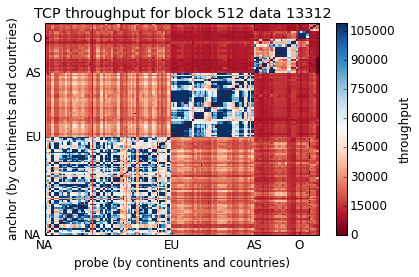

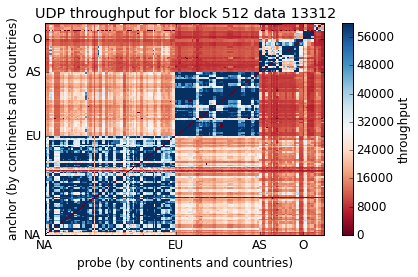

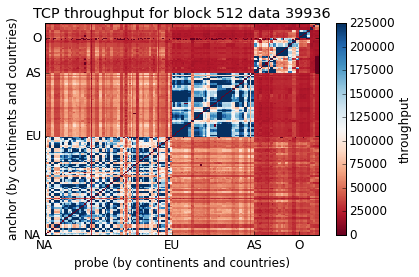

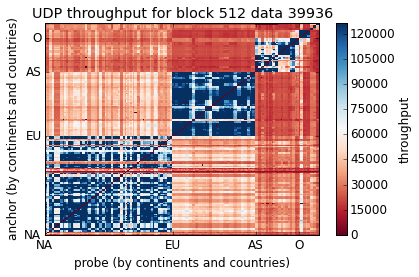

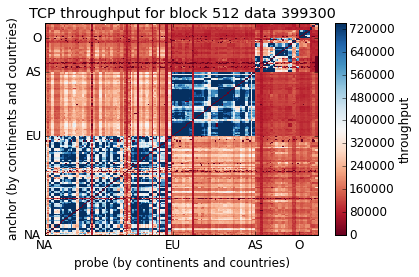

...

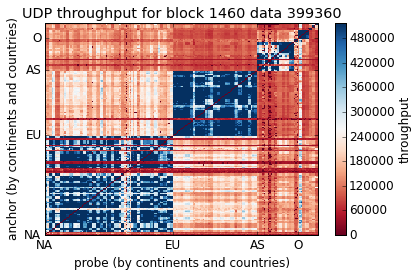

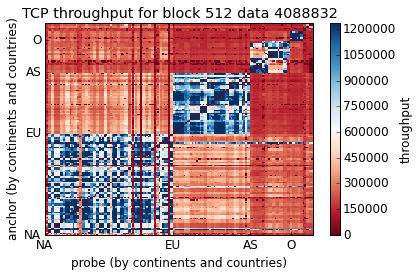

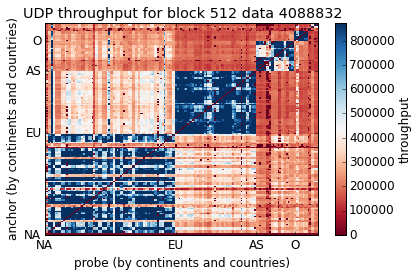

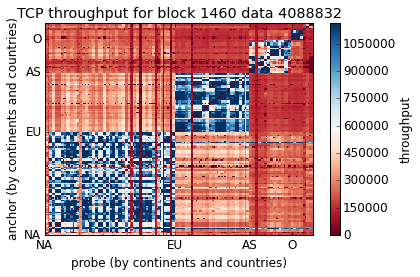

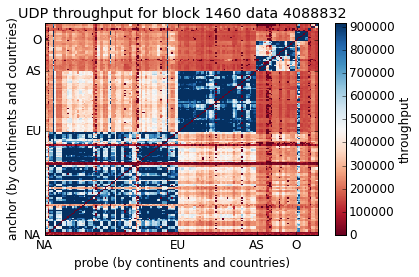

In [18]:
# thoughput per (filesize, blocksize, transport)-tuple heatmaps, port averaged
import config, locations
min_nodes = 140

for this_tcp, this_udp in zip(tcp_dfs, udp_dfs):

    this_tcp  = this_tcp.replace(float('inf'),0).reset_index()
    this_udp  = this_udp.replace(float('inf'),0).reset_index()
    
    # retreive filesize & blocksize
    filesize  = this_tcp.copycatFileSize.value_counts().index[0] - 1
    cid       = this_tcp.copycatRunId.value_counts().index[0]   
    blocksize = get_blocksize(cid)
    
    # Average RTTs
    grouped_tcp = this_tcp.groupby(["sourceIPv4Address", "destinationIPv4Address"])["throughput"]
    grouped_udp = this_udp.groupby(["sourceIPv4Address", "destinationIPv4Address"])["throughput"]

    this_tcp = grouped_tcp.agg([np.mean]).reset_index()
    this_udp = grouped_udp.agg([np.mean]).reset_index()

    # map node IPs to ordered ints
    this_tcp.sourceIPv4Address      = this_tcp.sourceIPv4Address.map(locations.countries_nb2)
    this_udp.sourceIPv4Address      = this_udp.sourceIPv4Address.map(locations.countries_nb2)    
    this_tcp.destinationIPv4Address = this_tcp.destinationIPv4Address.map(locations.countries_nb2)
    this_udp.destinationIPv4Address = this_udp.destinationIPv4Address.map(locations.countries_nb2)

    # remove buggy nodes
    this_tcp, tcp_dim = clean_df(this_tcp)
    this_udp, udp_dim = clean_df(this_udp)
    if udp_dim < min_nodes or tcp_dim < min_nodes:
        continue
    # get anchors continent indexes
    tcp_nodes_index = get_continent_index(this_tcp) 
    udp_nodes_index = get_continent_index(this_udp) 
    tcp_mean = this_tcp["mean"].mean()
    udp_mean = this_udp["mean"].mean()
    
    print("block "+str(blocksize)+" data "+str(filesize))
    print("tcp nodes: "+str(tcp_dim)+" udp nodes:"+str(udp_dim))
    print("tcp mean t: %.2f udp mean t: %.2f" % (tcp_mean, udp_mean))
    print()
    
    # re index to plot
    fill_with = 0
    this_tcp = this_tcp.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(fill_with)
    this_udp = this_udp.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(fill_with)

    #plot !
    gridplot(this_tcp, "throughput", lim=[0,tcp_dim], vrange=[0, 1.5*tcp_mean],
             title="TCP throughput for block "+str(blocksize)+" data "+str(filesize), ticks=tcp_nodes_index)#, file="plots/tcp-rtt-"+str(port)+".pdf")
    gridplot(this_udp, "throughput", lim=[0,udp_dim], vrange=[0, 1.5*udp_mean],
             title="UDP throughput for block "+str(blocksize)+" data "+str(filesize), ticks=udp_nodes_index)#, file="plots/udp-rtt-"+str(port)+".pdf")


port 1228 block 512 data 13312
nodes:198
diff mean t: -34139.55

port 12345 block 512 data 13312
nodes:183
diff mean t: -36738.78

port 8008 block 512 data 13312
nodes:196
diff mean t: -35559.82

port 1228 block 512 data 39936
nodes:194
diff mean t: -70818.75

port 12345 block 512 data 39936
nodes:181
diff mean t: -73346.40

port 8008 block 512 data 39936
nodes:193
diff mean t: -72235.99

port 1228 block 512 data 399300
nodes:190
diff mean t: -188535.69

port 12345 block 512 data 399300
nodes:167
diff mean t: -204622.32

port 8008 block 512 data 399300
nodes:185
diff mean t: -190043.52

port 1228 block 1460 data 13312
nodes:196
diff mean t: -36034.99

port 12345 block 1460 data 13312
nodes:183
diff mean t: -37458.35

port 8008 block 1460 data 13312
nodes:194
diff mean t: -37306.45

port 1228 block 1460 data 39936
nodes:195
diff mean t: -72196.50

port 12345 block 1460 data 39936
nodes:181
diff mean t: -79619.22

port 8008 block 1460 data 39936
nodes:190
diff mean t: -72033.95

port 122

ValueError: left cannot be >= right

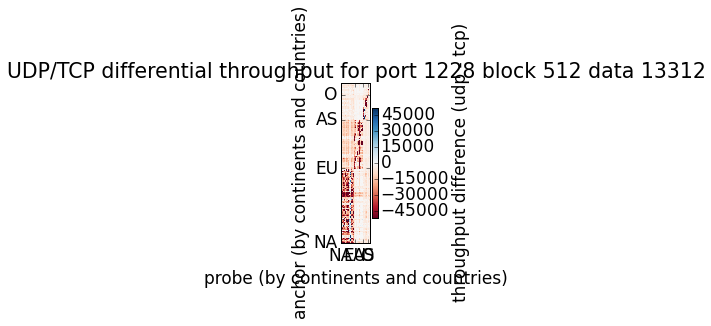

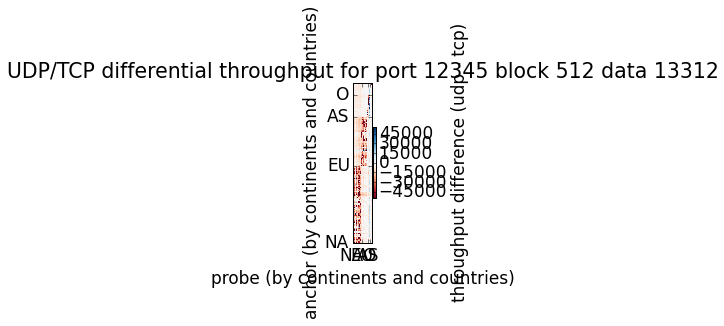

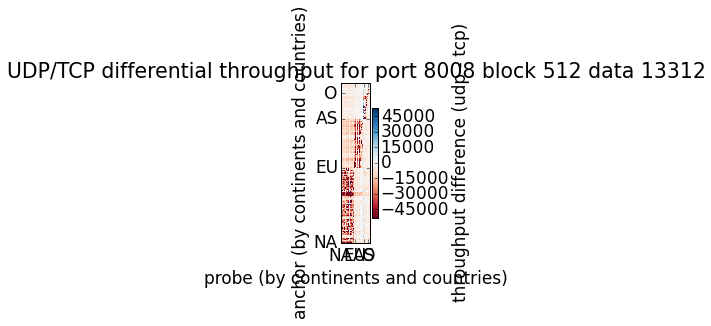

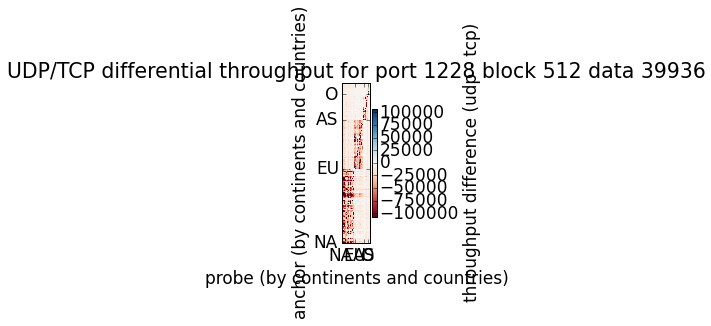

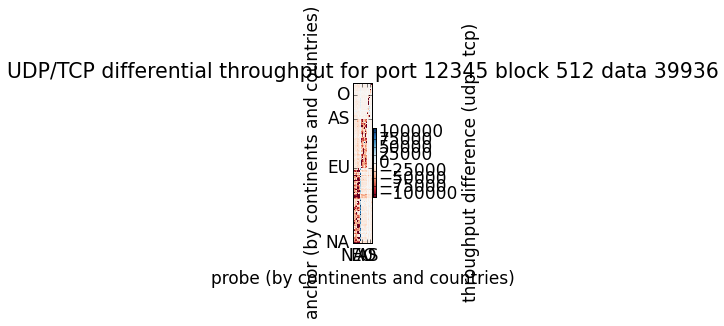

...

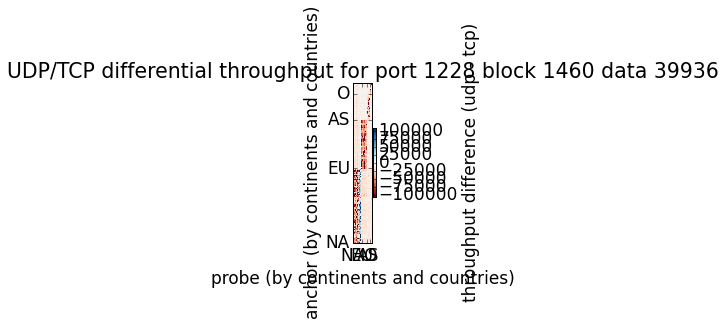

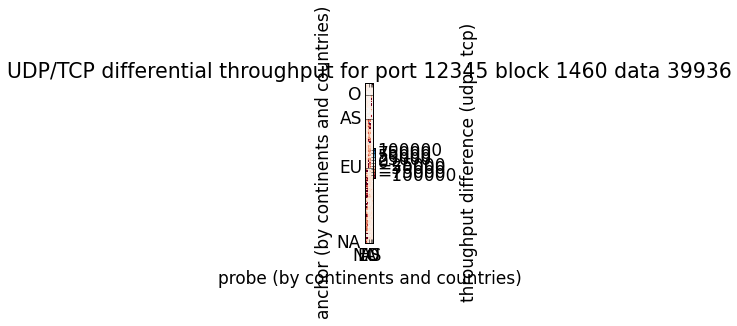

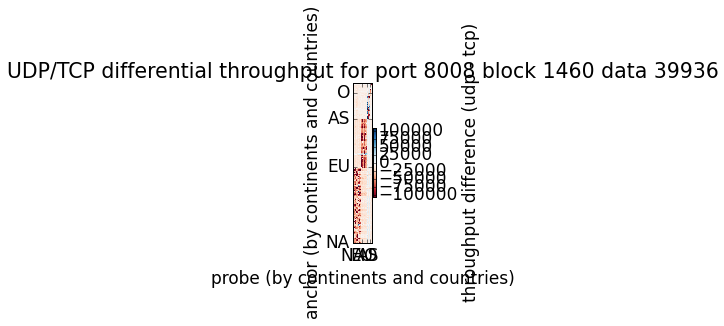

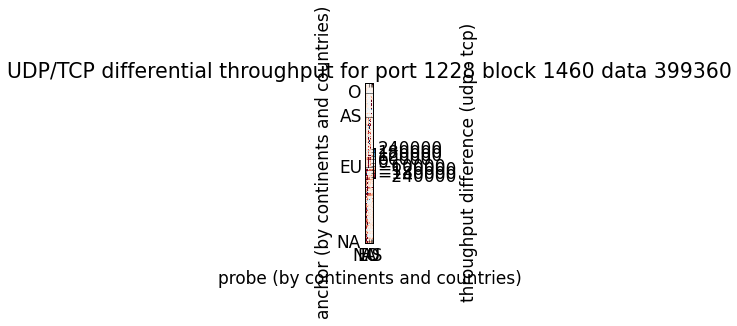

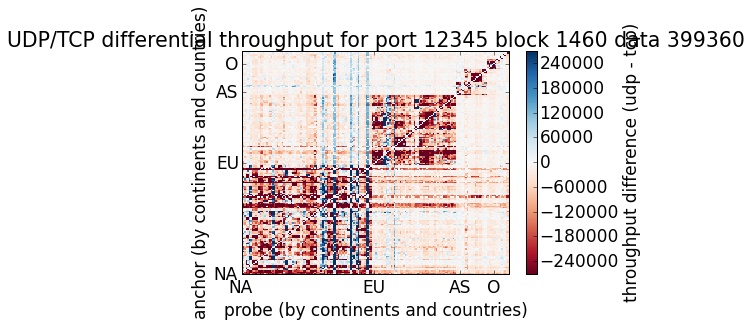

In [19]:
# differential thoughput per (filesize, blocksize, port, transport)-tuple heatmaps
import config, locations
import numpy as np
imp.reload(graph)
min_nodes = 100

for this_tcp, this_udp in zip(tcp_dfs, udp_dfs):

    this_tcp  = this_tcp.replace(float('inf'),0).reset_index()
    this_udp  = this_udp.replace(float('inf'),0).reset_index()
    
    # retreive filesize & blocksize
    filesize  = this_tcp.copycatFileSize.value_counts().index[0] - 1
    cid       = this_tcp.copycatRunId.value_counts().index[0]    
    blocksize = get_blocksize(cid)
    
    # Average RTTs
    grouped_tcp = this_tcp.groupby(["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort"])["throughput"]
    grouped_udp = this_udp.groupby(["sourceIPv4Address", "destinationIPv4Address", "destinationTransportPort"])["throughput"]

    this_tcp = grouped_tcp.agg([np.mean]).reset_index()
    this_udp = grouped_udp.agg([np.mean]).reset_index()

    for port in [1228, 12345, 8008]:
        # pick data for one port
        this_tcp_port = this_tcp[this_tcp.destinationTransportPort == port][["sourceIPv4Address","destinationIPv4Address", "mean"]]
        this_udp_port = this_udp[this_udp.destinationTransportPort == port][["sourceIPv4Address","destinationIPv4Address", "mean"]]

        # map node IPs to ordered ints
        this_tcp_port.sourceIPv4Address      = this_tcp_port.sourceIPv4Address.map(locations.countries_nb2)
        this_udp_port.sourceIPv4Address      = this_udp_port.sourceIPv4Address.map(locations.countries_nb2)    
        this_tcp_port.destinationIPv4Address = this_tcp_port.destinationIPv4Address.map(locations.countries_nb2)
        this_udp_port.destinationIPv4Address = this_udp_port.destinationIPv4Address.map(locations.countries_nb2)

        # remove buggy nodes
        this_tcp_port, tcp_dim = clean_df(this_tcp_port)
        this_udp_port, udp_dim = clean_df(this_udp_port)
        if udp_dim < min_nodes or tcp_dim < min_nodes:
            continue
        # get anchors continent indexes
        tcp_nodes_index = get_continent_index(this_tcp_port) 
        udp_nodes_index = get_continent_index(this_udp_port)        

        # re index to plot
        #fill_with = 0
        this_tcp_port = this_tcp_port.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"])
        this_udp_port = this_udp_port.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"])
        
        # compute diff, clean & get continent indexes
        this_diff = (this_udp_port - this_tcp_port).dropna()
        diff_mean = float(this_diff.mean())
        this_diff = this_diff.reset_index()
        nodes_index = get_continent_index(this_diff)

        this_diff, diff_dim = clean_df(this_diff)
        if diff_dim < min_nodes:
            continue
        this_diff = this_diff.set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(0)#.dropna()
        
        print("port "+str(port)+" block "+str(blocksize)+" data "+str(filesize))
        print("nodes:"+str(diff_dim))
        print("diff mean t: %.2f" % (diff_mean))
        print()
        
        #this_tcp  
        graph.gridplot(this_diff, "throughput difference (udp - tcp)", lim=[0,diff_dim], 
                       vrange=[1.5*diff_mean, -1.5*diff_mean],
                       title="UDP/TCP differential throughput for port "+str(port)+" block "+str(blocksize)+" data "+str(filesize), 
                       ticks=nodes_index)#, file="plots/diff-rtt-"+str(port)+".pdf")

In [32]:
this_tcp.empty

True

In [20]:
# differential thoughput per (filesize, blocksize, transport)-tuple heatmaps, port averaged
import config, locations
import numpy as np
imp.reload(graph)

# print diff grid per 3-tuples
# aggregating values using func
def diff(func, col):
    min_nodes = 140
    for this_tcp, this_udp in zip(tcp_dfs, udp_dfs):

        this_tcp  = this_tcp.replace(float('inf'),0).reset_index()
        this_udp  = this_udp.replace(float('inf'),0).reset_index()
        if this_tcp.empty or this_udp.empty:
            continue
        # retreive filesize & blocksize
        filesize  = this_tcp.copycatFileSize.value_counts().index[0] - 1
        cid       = this_tcp.copycatRunId.value_counts().index[0]
        blocksize = get_blocksize(cid)

        # Average RTTs
        grouped_tcp = this_tcp.groupby(["sourceIPv4Address", "destinationIPv4Address"])["throughput"]
        grouped_udp = this_udp.groupby(["sourceIPv4Address", "destinationIPv4Address"])["throughput"]

        this_tcp = grouped_tcp.agg([func]).reset_index()
        this_udp = grouped_udp.agg([func]).reset_index()

        # map node IPs to ordered ints
        this_tcp.sourceIPv4Address      = this_tcp.sourceIPv4Address.map(locations.countries_nb2)
        this_udp.sourceIPv4Address      = this_udp.sourceIPv4Address.map(locations.countries_nb2)    
        this_tcp.destinationIPv4Address = this_tcp.destinationIPv4Address.map(locations.countries_nb2)
        this_udp.destinationIPv4Address = this_udp.destinationIPv4Address.map(locations.countries_nb2)

        # remove buggy nodes
        this_tcp, tcp_dim = clean_df(this_tcp, data_col=col)
        this_udp, udp_dim = clean_df(this_udp, data_col=col)
        if udp_dim < min_nodes or tcp_dim < min_nodes:
            continue

        # re index to plot
        this_tcp = this_tcp.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"])
        this_udp = this_udp.reset_index(drop=True).set_index(["sourceIPv4Address","destinationIPv4Address"])

        # compute diff, clean & get continent indexes
        this_diff = (this_udp - this_tcp).dropna()
        diff_mean = float(this_diff.mean())
        this_diff = this_diff.reset_index()
        nodes_index = get_continent_index(this_diff)

        this_diff, diff_dim = clean_df(this_diff, data_col=col)
        if diff_dim < min_nodes:
            continue
        this_diff = this_diff.set_index(["sourceIPv4Address","destinationIPv4Address"]).unstack().fillna(0)
        print("block "+str(blocksize)+" data "+str(filesize))
        print("nodes:"+str(udp_dim))
        print("diff mean t: %.2f" % (diff_mean))
        print()

        #this_tcp
        #              title="UDP/TCP diff throughput for block "+str(blocksize)+" data "+str(filesize),
        gridplot(this_diff, "throughput difference (udp - tcp)", lim=[0,diff_dim], 
                 vrange=[1.5*diff_mean, -1.5*diff_mean],
                 font_size=12, ticks=nodes_index, 
                 file="plots/diffbw-"+col+"-"+str(blocksize)+"-"+str(filesize)+".pdf")


block 512 data 13312
nodes:199
diff mean t: -34295.83

block 512 data 39936
nodes:195
diff mean t: -69820.76

block 512 data 399300
nodes:193
diff mean t: -179728.59

block 1460 data 13312
nodes:198
diff mean t: -35639.50

block 1460 data 39936
nodes:195
diff mean t: -72171.06

block 1460 data 399360
nodes:192
diff mean t: -162039.24

block 512 data 4088832
nodes:163
diff mean t: -284300.94

block 1460 data 4088832
nodes:168
diff mean t: -222594.08



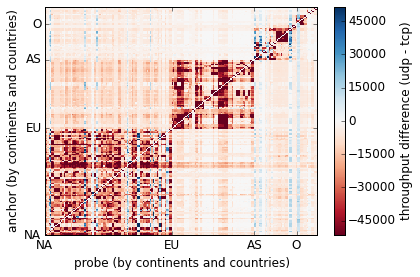

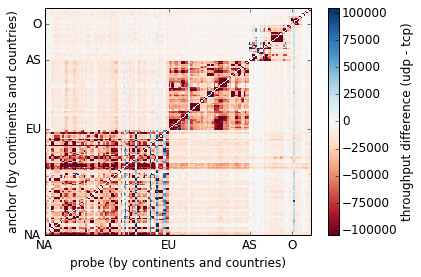

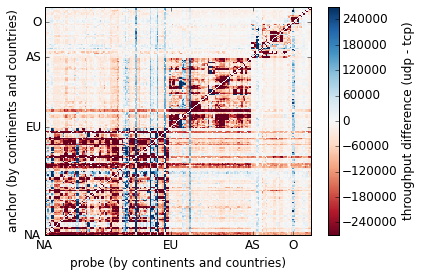

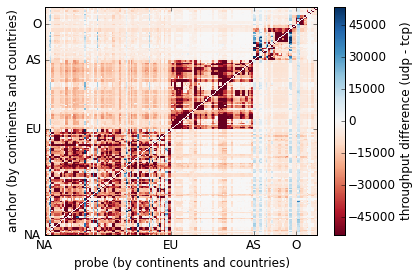

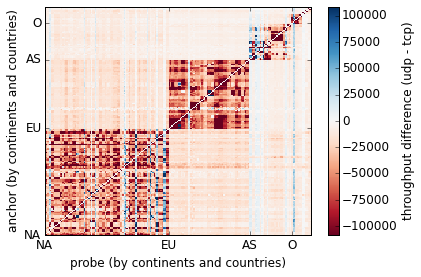

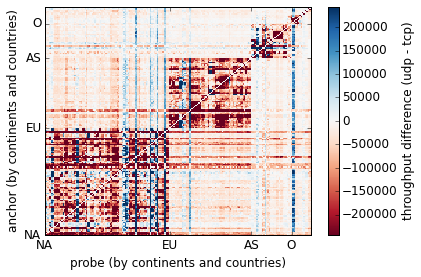

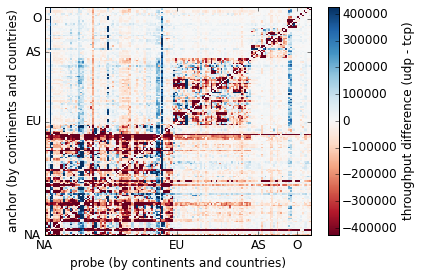

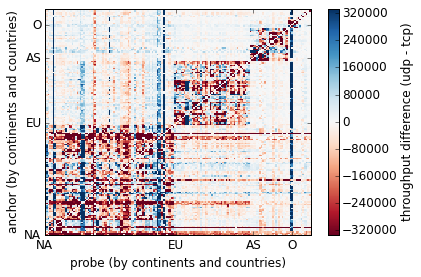

In [21]:
diff(np.mean, "mean")

block 512 data 13312
nodes:199
diff mean t: -52488.65

block 512 data 39936
nodes:195
diff mean t: -104376.45

block 512 data 399300
nodes:193
diff mean t: -215270.12

block 1460 data 13312
nodes:198
diff mean t: -54073.16

block 1460 data 39936
nodes:195
diff mean t: -104512.12

block 1460 data 399360
nodes:192
diff mean t: -188214.46

block 512 data 4088832
nodes:163
diff mean t: -302761.62

block 1460 data 4088832
nodes:168
diff mean t: -228672.65



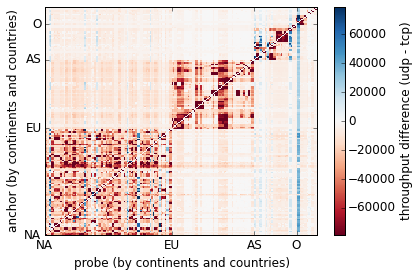

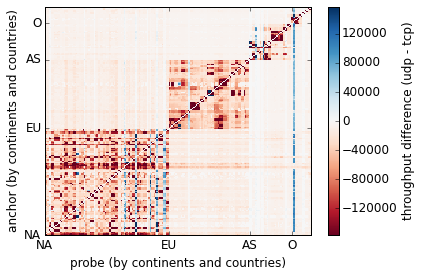

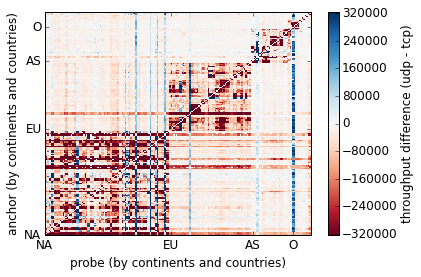

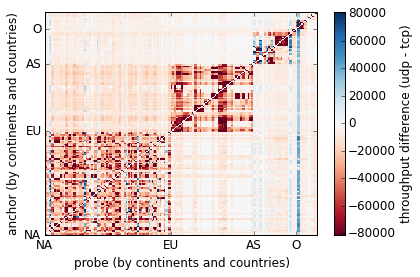

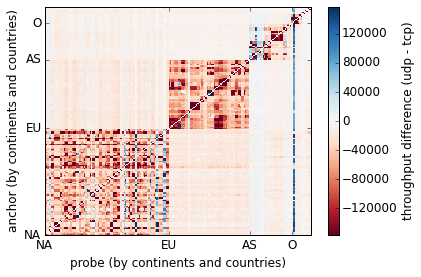

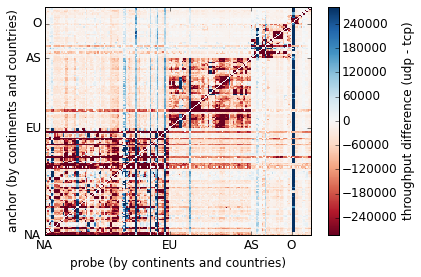

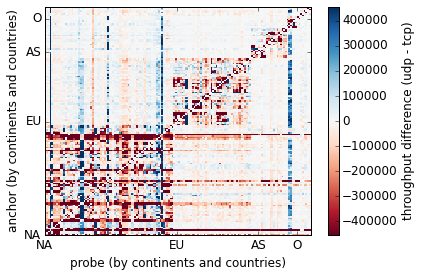

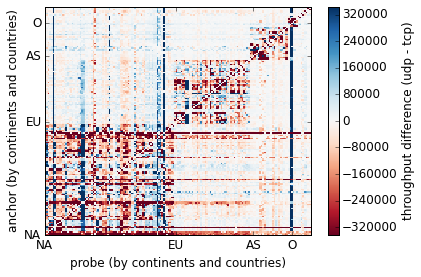

In [22]:
diff(np.max, "amax")

block 512 data 13312
nodes:199
diff mean t: -32860.88

block 512 data 39936
nodes:195
diff mean t: -66247.69

block 512 data 399300
nodes:193
diff mean t: -178293.39

block 1460 data 13312
nodes:198
diff mean t: -33123.38

block 1460 data 39936
nodes:195
diff mean t: -68661.79

block 1460 data 399360
nodes:192
diff mean t: -164143.99

block 512 data 4088832
nodes:163
diff mean t: -288704.23

block 1460 data 4088832
nodes:168
diff mean t: -228190.28



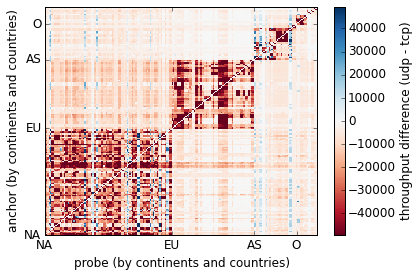

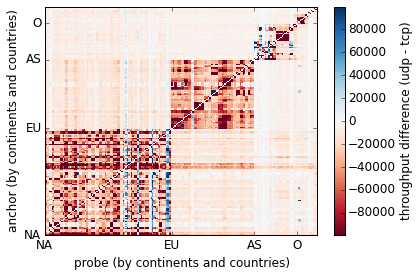

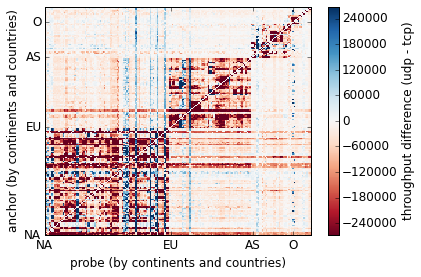

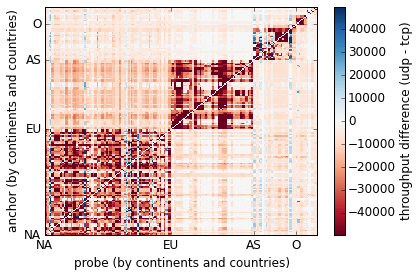

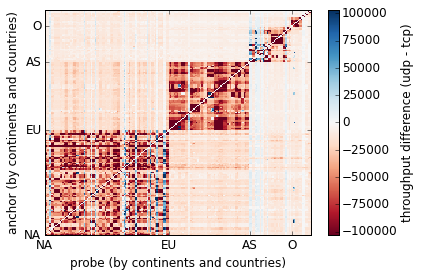

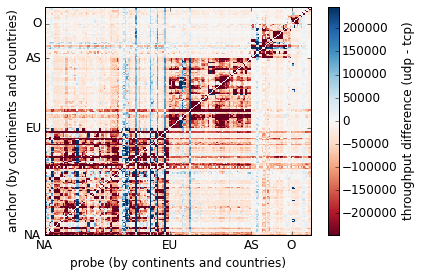

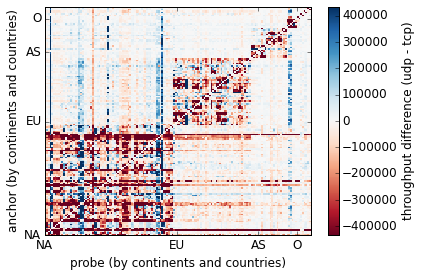

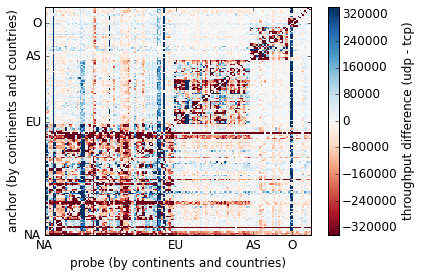

In [23]:
diff(np.median, "median")

block 512 data 13312
nodes:199
diff mean t: -20599.53

block 512 data 39936
nodes:195
diff mean t: -46016.27

block 512 data 399300
nodes:193
diff mean t: -144735.49

block 1460 data 13312
nodes:198
diff mean t: -22236.72

block 1460 data 39936
nodes:195
diff mean t: -46983.32

block 1460 data 399360
nodes:192
diff mean t: -128377.75

block 512 data 4088832
nodes:163
diff mean t: -256808.45

block 1460 data 4088832
nodes:168
diff mean t: -198499.02



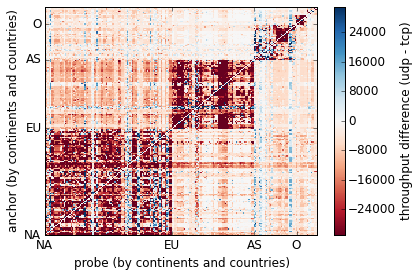

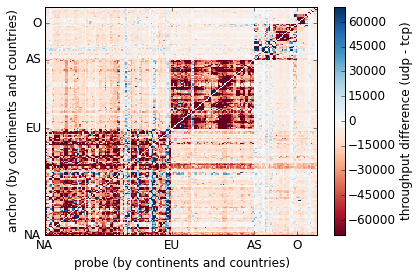

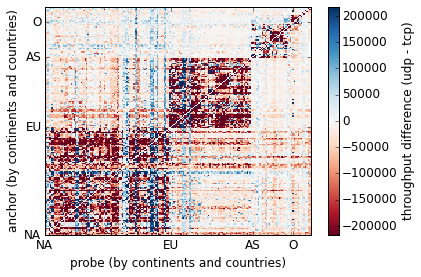

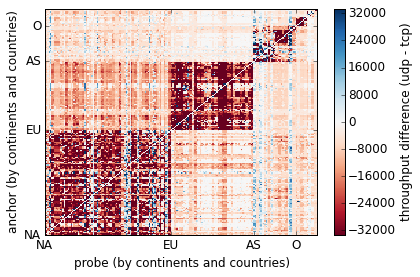

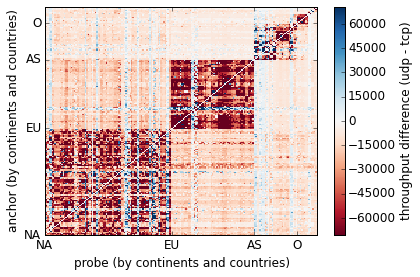

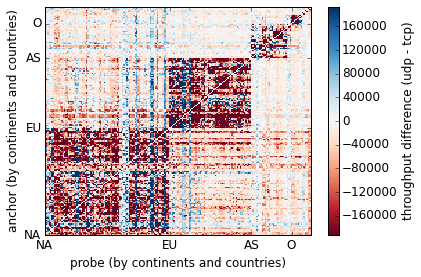

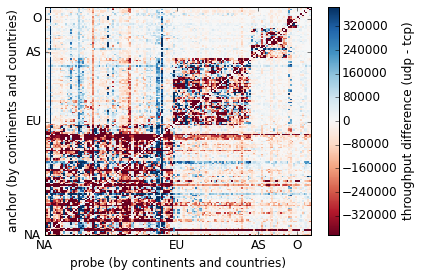

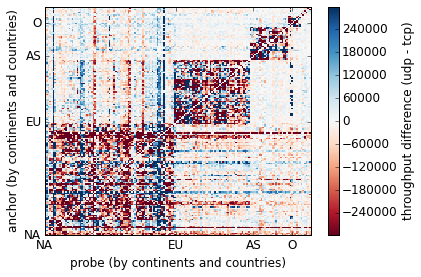

In [24]:
diff(np.min, "amin")

block 512 data 13312
nodes:199
diff mean t: -12369.72

block 512 data 39936
nodes:195
diff mean t: -21872.91

block 512 data 399300
nodes:193
diff mean t: -24455.29

block 1460 data 13312
nodes:198
diff mean t: -12368.78

block 1460 data 39936
nodes:195
diff mean t: -22335.82

block 1460 data 399360
nodes:192
diff mean t: -19595.76

block 512 data 4088832
nodes:163
diff mean t: -19912.61

block 1460 data 4088832
nodes:168
diff mean t: -10246.03



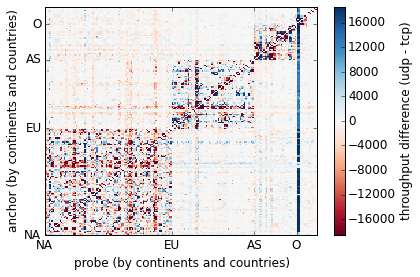

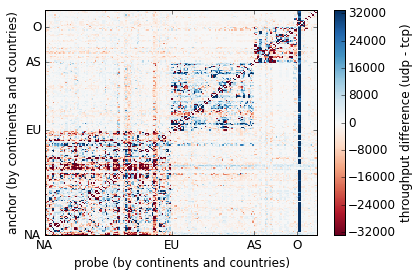

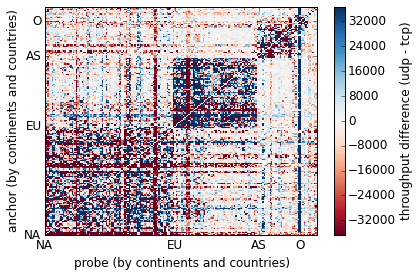

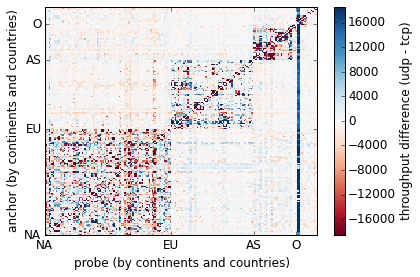

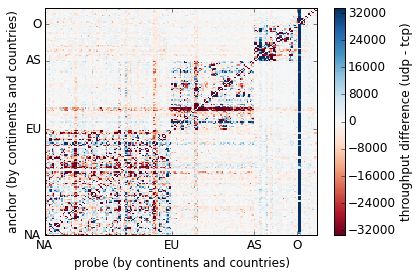

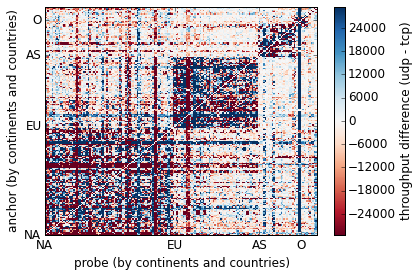

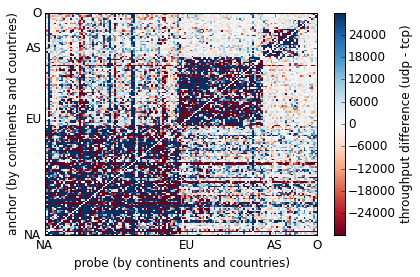

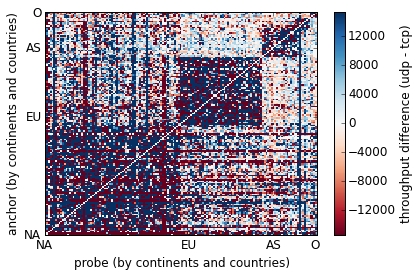

In [25]:
# STD per path, then diff
diff(np.std, "std")